## Import Data

In [0]:
# imports
import io
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
from google.colab import files
from collections import defaultdict
from IPython.display import display
from scipy.spatial.distance import pdist, squareform
np.set_printoptions(threshold=sys.maxsize)

In [0]:
# mount google drive
def mount():
  drive.mount('/content/gdrive')

In [3]:
uploaded = files.upload()
user_launch_counts_appAnon = pd.read_csv(io.BytesIO(uploaded['user_launch_counts_appAnon.csv']))

Saving user_launch_counts_appAnon.csv to user_launch_counts_appAnon.csv


In [5]:
uploaded = files.upload()
genres = pd.read_csv(io.BytesIO(uploaded['genres.csv']))

Saving genres.csv to genres.csv


In [6]:
uploaded = files.upload()
duration_seen = pd.read_csv(io.BytesIO(uploaded['duration_seen.csv']))

Saving duration_seen.csv to duration_seen.csv


### In a function example

In [0]:
# upload file
def upload():
  uploaded = files.upload()
  return uploaded

Saving user_launch_counts_appAnon.csv to user_launch_counts_appAnon (3).csv


In [0]:
# read csv file
def read_csv(uploaded):
  user_launch_counts_appAnon = pd.read_csv(io.BytesIO(uploaded['user_launch_counts_appAnon.csv']))
  return data

## Sort Initial Data

In [7]:
# sort data by user id and app id
#def sort_data(data):
  user_sorted = user_launch_counts_appAnon.sort_values(["userID", "appID"], ascending=[True, True])
  user_sorted.head()
  #return data

,userID,launches,appID
679,2,1,259
7798,2,6,2540
13435,2,2,3744
13908,2,6,3887
14139,2,10,3909


## Unique apps and users

In [0]:
# get number of and actual list of unique values in each column
#def unique_apps_users(user_sorted):
  user_sorted["userID"].value_counts() #10,368
  user_sorted["appID"].value_counts() # 45,788
  user_sorted["launches"].value_counts() # 3,482

  unique_apps = user_sorted["appID"].unique()
  unique_apps.sort()

  unique_users = user_sorted["userID"].unique()
  unique_users.sort()

  #return unique_apps, unique_users

## Get Features

In [9]:
# get features of the raw data
#def show_sorted(user_sorted):
  print("User sorted features: ")
  display(user_sorted.describe())
  #display(user_sorted.boxplot())
  #display(user_sorted.plot.hist())

User sorted features: 


,userID,launches,appID
count,289142.000000,289142.000000,289142.000000
mean,8095.106577,77.509248,17754.031587
std,4672.359628,792.188540,13501.344218
min,2.000000,1.000000,1.000000
25%,4100.000000,1.000000,3969.000000
50%,7961.000000,3.000000,14670.000000
75%,12131.000000,13.000000,30133.000000
max,16194.000000,106992.000000,45788.000000


## Create dict of users and apps

In [10]:
# iterate through each row and add each occurrence to dictionary, this will return a dict
# that has each user with the list of apps they have used
#def get_user_apps(user_sorted):
  user_apps = defaultdict(list)

  for index, row in user_sorted.iterrows():
    user_apps[row["userID"]].append(row["appID"])

  user_apps = dict(user_apps)

  print("User apps: ", user_apps)
  print(" ")
  #return user_apps

User apps:  {2: [259, 2540, 3744, 3887, 3909, 3923, 3939, 3942, 3946, 3949, 3950, 3952, 3954, 3956, 3960, 3969, 3980, 3989, 4972, 5683, 5957, 6445, 6591, 11108, 11151, 11263, 11479, 12524, 13834, 14682, 15172, 16818, 17181, 18257, 19974, 22767, 23701, 25507, 25512, 25513, 27390, 27393, 28123, 28804, 31336, 34847, 37208, 39023, 43886], 4: [3946, 3949, 3953, 3954, 3960, 3980, 3991, 5344, 7415, 31336, 43313], 5: [3912, 3953, 3956, 3960, 3980, 31336, 42673], 6: [31336], 7: [3909, 3950, 3980, 4972, 31336], 8: [3954, 3980, 31336], 10: [3980, 8584, 31336], 12: [3909, 3946, 3950, 3952, 3953, 3954, 3958, 3960, 3980, 8880, 12303, 12684, 14655, 14682, 21898, 23362, 30753, 31336, 32735, 33480, 33855, 43285, 45035], 13: [257, 3273, 3286, 3548, 3688, 3909, 3911, 3912, 3920, 3939, 3949, 3950, 3952, 3953, 3954, 3958, 3960, 3969, 3980, 5344, 6638, 7415, 10610, 11334, 12096, 12303, 12309, 12877, 12974, 14190, 14682, 14978, 19208, 21675, 22935, 25234, 25270, 26042, 27387, 27634, 27688, 27978, 28786, 2880

## Create dict of user and launches

In [11]:
  temp_user_launches = defaultdict(list)

  for index, row in user_sorted.iterrows():
    temp_user_launches[row["userID"]].append(row["launches"])

  temp_user_launches = dict(temp_user_launches)

  print("User launches: ", temp_user_launches)
  print(" ")
  #return user_apps

User launches:  {2: [1, 6, 2, 6, 10, 1, 1, 2, 1, 2, 82, 12, 39, 5, 4, 11, 311, 1, 19, 1, 5, 1, 8, 1, 1, 6, 11, 4, 3, 1, 2, 3, 2, 1, 1, 4, 2, 4, 2, 6, 5, 2, 1, 1, 1, 7, 2, 2, 8], 4: [1, 1, 1, 7, 1, 30, 1, 1, 6, 11, 5], 5: [1, 1, 1, 2, 10, 5, 2], 6: [1], 7: [2, 2, 11, 3, 1], 8: [1, 1, 1], 10: [1, 2, 1], 12: [7, 20, 14, 3, 1, 27, 3, 1, 106, 2, 9, 3, 4, 4, 3, 3, 5, 1, 1, 5, 3, 2, 1], 13: [2, 1, 2, 4, 14, 8, 2, 1, 1, 1, 9, 62, 23, 10, 82, 5, 24, 20, 540, 6, 7, 6, 10, 1, 1, 34, 56, 2, 5, 16, 2, 1, 91, 8, 2, 36, 1, 2, 61, 1, 1, 2, 3, 8, 32, 12, 1, 2, 1, 3, 4, 1, 1, 351], 14: [1], 15: [5, 6, 1, 2, 2, 19, 8, 6, 4, 10, 3, 5, 115, 1, 1, 1, 1, 1, 1, 6, 1, 3, 3, 2, 1, 2, 2, 1, 1], 16: [1], 18: [1, 3, 17, 1, 1, 1, 1, 2, 5, 1], 20: [3, 2, 2, 1, 1, 19, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3], 22: [3, 10, 1, 1, 4, 9, 5, 46, 3, 1, 2, 7, 10, 1, 21, 5], 23: [2, 5, 14, 3, 9], 24: [1, 3, 1, 1, 1, 1, 4, 2, 38, 9, 2, 17, 1, 7, 1, 146, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 10, 1, 1], 26: [1, 3, 1, 18, 1, 4, 1, 1,

In [0]:
# for each user, note how many launches they have had, how many apps they have used and the average
user_launches = defaultdict(list)

for key, value in temp_user_launches.items():
  user_launches[key].append(sum(value))
  user_launches[key].append(len(value))
  user_launches[key].append(sum(value)/len(value))

user_launches = dict(user_launches)


In [0]:
user_launches_DF = pd.DataFrame.from_dict(user_launches, orient="index")
user_launches_DF.reset_index(level=0, inplace=True)
user_launches_DF.rename(columns={'index':'userID', 0:"launches", 1:"apps_used", 2:"average_launches"}, inplace=True)
user_launches_DF.sort_values('userID', inplace=True)
user_launches_DF.reset_index(drop=True, inplace=True)

In [14]:
user_launches_DF["duration_seen"] = duration_seen["duration_seen_seconds"]
user_launches_DF

,userID,launches,apps_used,average_launches,duration_seen
0,2,614,49,12.530612,138689
1,4,65,11,5.909091,481495
2,5,22,7,3.142857,4322898
3,6,1,1,1.000000,0
4,7,19,5,3.800000,5731
...,...,...,...,...,...
10363,16186,348,22,15.818182,188819
10364,16189,360,25,14.400000,800404
10365,16191,66,19,3.473684,3170203
10366,16193,2,2,1.000000,56


In [15]:
# find users that are unvaluable (anomalies)
# requirements: have been seen for at least 5 minutes, have used at least 1 app an hour if seen for less than 1 day, have used at least 1 app a day of seen for more than 1 day
unvaluable_users = []

for index, row in user_launches_DF.iterrows():
  if row["duration_seen"] < 300 or (row["duration_seen"] < 86400 and (row["duration_seen"] / 3600) / row["launches"] > 1 ) or (row["duration_seen"] / 86400) / row["launches"] > 1 :
    unvaluable_users.append(row["userID"])

len(unvaluable_users)

2864

## Create dict of apps and users

In [16]:
# iterate through each row and add each occurrence to dictionary, this will return a dict
# that has each app with the list users that have used it
# currently keys not in order
#def get_app_users(user_sorted):
  app_users = defaultdict(list)

  for index, row in user_sorted.iterrows():
    app_users[row["appID"]].append(row["userID"])

  app_users = dict(app_users)

  print("App users: ", app_users)
  print(" ")
  #return app_users

App users:  {259: [2], 2540: [2, 1125, 6448, 9630, 9966, 15756], 3744: [2, 540, 1976, 2189, 2273, 3986, 4808, 5756, 6031, 6845, 6870, 10112, 11361, 11886, 13386, 13792, 14000, 16038], 3887: [2, 619, 2134, 2907, 3550, 4238, 4407, 5906, 6205, 6460, 8849, 10856, 11013, 11153, 12131, 12290, 12497, 13875, 13939, 14446, 15840], 3909: [2, 7, 12, 13, 20, 22, 24, 26, 33, 35, 36, 48, 51, 55, 61, 68, 69, 71, 72, 73, 78, 79, 80, 84, 87, 89, 94, 96, 98, 99, 100, 104, 105, 107, 110, 115, 116, 117, 121, 128, 129, 130, 135, 137, 140, 142, 144, 145, 147, 151, 153, 155, 156, 158, 159, 160, 162, 165, 166, 167, 168, 170, 173, 176, 177, 179, 181, 182, 194, 197, 198, 199, 208, 210, 215, 217, 218, 225, 229, 231, 235, 237, 238, 240, 241, 247, 253, 255, 258, 261, 262, 265, 273, 287, 290, 291, 302, 306, 310, 311, 318, 321, 322, 329, 330, 333, 334, 339, 340, 347, 350, 351, 352, 358, 361, 369, 376, 381, 382, 383, 384, 386, 388, 391, 396, 397, 399, 403, 406, 408, 413, 419, 420, 425, 426, 427, 434, 443, 452, 457, 4

## Create a dict of apps and launches

In [17]:
#def get_app_launches(user_sorted):
  temp_app_counts = defaultdict(list)

  for index, row in user_sorted.iterrows():
    temp_app_counts[row["appID"]].append(row["launches"])

  temp_app_counts = dict(temp_app_counts)

  print("App counts: ", temp_app_counts)
  print(" ")
  #return app_launches

App counts:  {259: [1], 2540: [6, 1, 113, 1, 6, 84], 3744: [2, 4, 1, 7, 2, 1, 1, 1, 3, 4, 2, 3, 1, 3, 2, 1, 1, 2], 3887: [6, 1, 12, 1, 1, 38, 10, 1, 28, 3, 6, 5, 5, 1, 3, 2, 3, 1, 2, 18, 15], 3909: [10, 2, 7, 8, 3, 10, 3, 18, 1, 1, 1, 13, 1, 13, 24, 8, 1, 46, 5, 3, 3, 12, 7, 1, 52, 458, 2, 118, 3, 5, 1, 1, 40, 5, 1, 1, 1, 20, 138, 42, 28, 292, 27, 2, 80, 265, 184, 1, 2, 4, 20, 15, 1, 2, 1, 1, 1, 44, 2, 3, 35, 263, 2, 15, 1047, 7, 1, 138, 3, 1, 26, 1, 1, 1, 3, 1, 5, 1, 31, 20, 1, 292, 392, 160, 190, 1, 12, 1070, 1, 24, 3, 16, 15, 3, 1, 6, 9, 66, 24, 2, 4, 58, 1, 66, 102, 57, 1, 30, 1, 1, 2, 1, 33, 1, 148, 51, 112, 83, 1, 44, 1, 2, 1, 1, 16, 3, 61, 11, 3, 6, 16, 20, 68, 41, 48, 5, 2, 8, 18, 721, 24, 2, 218, 15, 4, 4, 6, 5, 21, 25, 4, 1, 4, 13, 24, 1, 4, 1, 53, 1, 2, 2, 3, 4, 49, 32, 90, 1, 2, 1, 256, 24, 365, 11, 2, 1, 1, 78, 9, 1, 50, 1, 1, 1, 107, 3, 4, 5, 1, 1, 1, 20, 243, 13, 682, 379, 2, 1, 116, 95, 31, 59, 18, 4, 1, 8, 3, 75, 99, 71, 81, 5, 128, 2, 35, 4, 18, 1, 2, 149, 1, 18, 148,

In [0]:
# for each app, note how many launches it has had, how many users have used it and the average
app_launches = defaultdict(list)

for key, value in temp_app_counts.items():
  app_launches[key].append(sum(value))
  app_launches[key].append(len(value))
  app_launches[key].append(sum(value)/len(value))

app_launches = dict(app_launches)

In [19]:
app_launches_DF = pd.DataFrame.from_dict(app_launches, orient="index")
app_launches_DF.reset_index(level=0, inplace=True)
app_launches_DF.rename(columns={'index':'appID', 0:"total_launches", 1:"user_count", 2:"average_launches"}, inplace=True)
app_launches_DF.sort_values('appID', inplace=True)
app_launches_DF.reset_index(drop=True, inplace=True)
app_launches_DF.index = np.arange(1, len(app_launches_DF)+1)

app_launches_DF

,appID,total_launches,user_count,average_launches
1,1,5,2,2.500000
2,2,52,1,52.000000
3,3,260,38,6.842105
4,4,1,1,1.000000
5,5,1,1,1.000000
...,...,...,...,...
45784,45784,194,6,32.333333
45785,45785,3,1,3.000000
45786,45786,9,4,2.250000
45787,45787,3,1,3.000000


In [20]:
app_launches_DF.loc[1]['average_launches']

2.5

In [21]:
app_launches_DF.loc[31336]

appID               31336.000000
total_launches      67914.000000
user_count          10173.000000
average_launches        6.675907
Name: 31336, dtype: float64

## Map user apps dict to dataframe

### Unnormalised Version

In [0]:
#create a sparse data frame showing whether each user has used an app before and how often
#def create_df(user_apps, unique_apps, unique_users):
  user_apps_DF = pd.DataFrame(columns=unique_apps, index=unique_users)
  user_apps_DF = user_apps_DF.fillna(0)

  for key, value in user_apps.items():
    for entry in value:
      user_apps_DF.at[key, entry] = temp_user_launches[key][value.index(entry)]

  user_apps_DF.sort_index(axis=0, inplace=True)
  #return user_apps_DF

In [23]:
# testing
user_apps_DF.at[2, 2540]

6

In [24]:
user_apps_DF.at[6448, 2540]

113

In [25]:
user_apps_DF

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,...,45749,45750,45751,45752,45753,45754,45755,45756,45757,45758,45759,45760,45761,45762,45763,45764,45765,45766,45767,45768,45769,45770,45771,45772,45773,45774,45775,45776,45777,45778,45779,45780,45781,45782,45783,45784,45785,45786,45787,45788
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16186,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
16189,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
16191,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
16193,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Normalised Version

In [26]:
app_launches_DF.loc[2540]['average_launches']

35.166666666666664

In [0]:
  user_apps_normalised = pd.DataFrame(columns=unique_apps, index=unique_users)

  for key, value in user_apps.items():
    for entry in value:
      user_apps_normalised.at[key, entry] = temp_user_launches[key][value.index(entry)] / app_launches_DF.loc[entry]['average_launches']

  user_apps_normalised.sort_index(axis=0, inplace=True)
  user_apps_normalised = user_apps_normalised.fillna(0)

In [28]:
user_apps_normalised

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,...,45749,45750,45751,45752,45753,45754,45755,45756,45757,45758,45759,45760,45761,45762,45763,45764,45765,45766,45767,45768,45769,45770,45771,45772,45773,45774,45775,45776,45777,45778,45779,45780,45781,45782,45783,45784,45785,45786,45787,45788
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16186,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16189,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16191,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16193,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
# round to 2 decimal place
user_apps_normalised = user_apps_normalised.round(2)

In [30]:
type(user_apps_normalised.iloc[2][2540])

numpy.float64

In [31]:
# should be 6 / 35.1
user_apps_normalised.at[2, 2540]

0.17

In [32]:
# should be 113 / 35.1
user_apps_normalised.at[6448, 2540]

3.21

## Saving Dataframe (only need when new columns are added)

In [0]:
# convert dataframe to csv 
#def convert_to_csv(user_apps_DF):
  user_apps_DF.to_csv('sparse_dataframe.csv')

## Get counts of each app, convert to dataframe


In [33]:
# there are 10367 users that do not use app 259
user_apps_DF[1].value_counts()

0    10366
3        1
2        1
Name: 1, dtype: int64

In [34]:
# iterate through each app and count how many occurences there are where a 1 is in its column, ie how many users launched the app
# def get_app_counts(user_apps_DF, unique_apps):

app_counts = {}

for entry in unique_apps:
    app_counts[entry] = (10368 - user_apps_DF[entry].value_counts()[0])

print("App counts: ", app_counts)
print(" ")

  #return app_counts

App counts:  {1: 2, 2: 1, 3: 38, 4: 1, 5: 1, 6: 1, 7: 3, 8: 1, 9: 2, 10: 1, 11: 1, 12: 1, 13: 2, 14: 1, 15: 1, 16: 1, 17: 1, 18: 2, 19: 1, 20: 3, 21: 3, 22: 1, 23: 1, 24: 2, 25: 1, 26: 1, 27: 2, 28: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 34: 1, 35: 1, 36: 1, 37: 1, 38: 2, 39: 2, 40: 3, 41: 1, 42: 1, 43: 6, 44: 1, 45: 1, 46: 2, 47: 20, 48: 1, 49: 1, 50: 1, 51: 1, 52: 1, 53: 1, 54: 1, 55: 1, 56: 1, 57: 1, 58: 1, 59: 8, 60: 1, 61: 1, 62: 2, 63: 1, 64: 1, 65: 1, 66: 1, 67: 2, 68: 1, 69: 1, 70: 1, 71: 4, 72: 1, 73: 1, 74: 6, 75: 1, 76: 1, 77: 1, 78: 1, 79: 4, 80: 13, 81: 3, 82: 3, 83: 1, 84: 1, 85: 3, 86: 1, 87: 2, 88: 4, 89: 1, 90: 1, 91: 1, 92: 3, 93: 1, 94: 4, 95: 28, 96: 1, 97: 18, 98: 10, 99: 12, 100: 1, 101: 26, 102: 1, 103: 1, 104: 6, 105: 3, 106: 1, 107: 14, 108: 11, 109: 1, 110: 1, 111: 1, 112: 1, 113: 3, 114: 1, 115: 1, 116: 2, 117: 1, 118: 1, 119: 1, 120: 2, 121: 1, 122: 1, 123: 2, 124: 1, 125: 1, 126: 1, 127: 1, 128: 1, 129: 4, 130: 3, 131: 2, 132: 1, 133: 7, 134: 1, 135: 1, 136:

In [35]:
# convert app counts to a dataframe (need to change column names and reset index to make it readable)
#def convert_counts_to_df(app_counts):
  app_counts_DF = pd.DataFrame(list(app_counts.items()), columns=['appID', 'count'])
  app_counts_DF.sort_values('count', ascending=False, inplace=True)
  app_counts_DF.reset_index(drop=True, inplace=True)

  print("App counts")
  display(app_counts_DF)
  print(" ")

  #return app_counts_DF

App counts


,appID,count
0,31336,10173
1,3980,9586
2,3969,6452
3,3950,5207
4,28804,4952
...,...,...
45783,25427,1
45784,25426,1
45785,25424,1
45786,9468,1


## Show app counts

In [0]:
#def show_app_counts_boxplot(app_counts_DF):
  print("App counts boxplot: ")
  display(app_counts_DF.boxplot())
  #sns.boxplot(x='appID', y='count', data=app_counts_DF)

In [0]:
#def show_app_counts_scatter(app_counts_DF, num):
  print("App counts scatter: ")
  sns.regplot(x='appID', y='count', data=app_counts_DF.iloc[:num], fit_reg=False)

In [0]:
def show_app_counts_bar(app_counts_DF, num):
  print("App counts bar graph: ")
  sns.barplot(x='appID', y='count', data=app_counts_DF.iloc[:num], order=app_counts_DF.iloc[:num]['appID'])

## Group apps by count

In [0]:
# group apps together by their counts, showing how many instances there are of each count occurence
#def group_apps(app_counts_DF):
  grouped_apps = app_counts_DF.groupby(['count']).count()
  grouped_apps.reset_index(inplace=True)
  grouped_apps.rename(columns={'count':'user_count', 'appID':'count'}, inplace=True)

  #return grouped_apps

Grouped apps bar graph: 


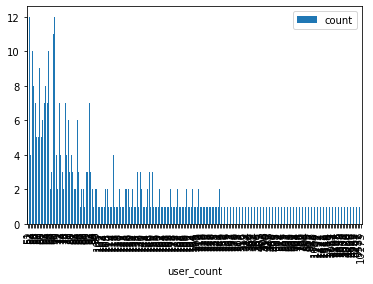

In [0]:
# show grouped apps
#def show_grouped_apps(grouped_apps):
  #grouped_apps['count'].iloc[50:].sum()
  print("Grouped apps bar graph: ")
  display(grouped_apps.iloc[50:].plot.bar(x='user_count', y='count'))

## Main Functions

### Setup (not needed)

In [0]:
# setup functions to import and save data
def setup():
  uploaded = upload()
  data = read_csv(uploaded)

  return data

### Main

In [0]:
# main functions to sort and analyse data
#def main(data):
  user_sorted = sort_data(data)
  #show_sorted(user_sorted)
  unique_apps, unique_users = unique_apps_users(user_sorted)
  user_apps = get_user_apps(user_sorted)
  app_users = get_app_users(user_sorted)
  user_apps_DF = create_df(user_apps, unique_apps, unique_users)
  #convert_to_csv(user_apps_DF)
  app_counts = get_app_counts(user_apps_DF, unique_apps)
  app_counts_DF = convert_counts_to_df(app_counts)
  grouped_apps = group_apps(app_counts_DF)

  return app_counts_DF, user_apps_DF, grouped_apps, unique_apps, unique_users

In [0]:
# call funtions 
data = setup()
app_counts_DF, user_apps_DF, grouped_apps, unique_apps, unique_users = main(data)

Saving user_launches_appAnon.csv to user_launches_appAnon.csv
User apps:  {177: [1, 878, 879, 2145, 2259, 2296, 2573, 2594, 2634, 2667, 2766, 2830, 3201, 3389, 3581, 3818, 3909, 3911, 3912, 3923, 3929, 3930, 3937, 3939, 3942, 3945, 3946, 3948, 3949, 3950, 3952, 3953, 3954, 3956, 3958, 3964, 3965, 3968, 3969, 3972, 3973, 3976, 3980, 3981, 3983, 3989, 3991, 4186, 4823, 4833, 4892, 5259, 5344, 5412, 5452, 5553, 5581, 5644, 5660, 6112, 6113, 6242, 6295, 6321, 6379, 6439, 6509, 6593, 7092, 7227, 7415, 7461, 7896, 8004, 8046, 8423, 8444, 8554, 8706, 8725, 8876, 8878, 8919, 8981, 9223, 9372, 9388, 9462, 9823, 9964, 10096, 10351, 10357, 10365, 10371, 10543, 10545, 11121, 11155, 11249, 11334, 11339, 11489, 11559, 11641, 12020, 12303, 12309, 12312, 12364, 12496, 12598, 12772, 12773, 12789, 12868, 12871, 12876, 13142, 13272, 14033, 14068, 14190, 14345, 14432, 14550, 14637, 14649, 14655, 14663, 14666, 14667, 14670, 14676, 14682, 14688, 14708, 14805, 14886, 14995, 15016, 15308, 15383, 15439, 15441,

KeyboardInterrupt: ignored

### Show app counts graphs

App counts boxplot: 


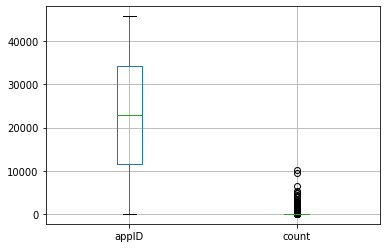

In [0]:
show_app_counts_boxplot(app_counts_DF)

App counts scatter: 


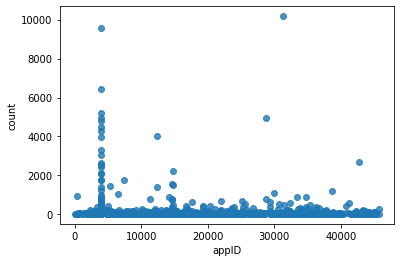

In [0]:
show_app_counts_scatter(app_counts_DF, 1000)

App counts bar graph: 


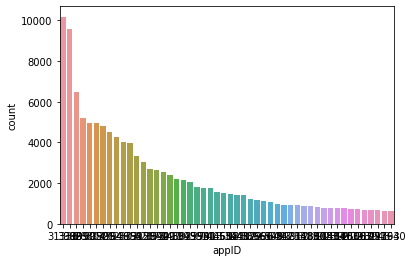

In [0]:
show_app_counts_bar(app_counts_DF, 50)

In [0]:
# don't actually know what this shows
sns.kdeplot(app_counts_DF.iloc[:50]['appID'], app_counts_DF.iloc[:50]['count'])

In [0]:
# also don't actually know what this shows
sns.clustermap(app_counts_DF.iloc[:100])

### Actual Working

In [0]:
def get_users_top_apps(DF, app_counts_DF, unvaluable_users, num):
  # user_apps_DF = DF.drop(DF.index[100:])
  user_apps_DF = DF.drop(unvaluable_users)
  user_apps_DF = user_apps_DF.drop(app_counts_DF['appID'].iloc[num:], axis=1)

  return user_apps_DF

In [60]:
# using unnormalised data
temp_top_100 = get_users_top_apps(user_apps_DF, app_counts_DF, unvaluable_users, 80)
temp_top_100

,312,3273,3909,3911,3912,3915,3920,3923,3929,3939,3941,3942,3945,3946,3947,3948,3949,3950,3952,3953,3954,3956,3958,3960,3968,3969,3972,3976,3980,3981,3989,3990,3991,4972,5344,6549,7415,11334,12303,12309,14190,14655,14663,14666,14670,14672,14682,14688,14707,16648,16821,17640,19208,19222,20278,21971,23701,23980,25067,25234,25555,28804,28808,29274,29393,29964,30753,31336,31430,32411,33480,34715,34834,35312,36239,36705,38666,40796,41213,42673
2,0,0,10,0,0,0,0,1,0,1,0,2,0,1,0,0,2,82,12,0,39,5,0,4,0,11,0,0,311,0,1,0,0,19,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,7,0,0,1,0,0,0,0,30,0,0,0,1,0,1,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,11,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,7,0,0,0,0,0,0,0,0,0,0,20,0,0,0,14,3,1,27,0,3,1,0,0,0,0,106,0,0,0,0,0,0,0,0,0,9,0,0,4,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,1,0,0,5,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16175,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,2,0,0,0,0,2,0,0,15,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0
16186,0,0,10,0,0,0,0,0,0,3,0,0,0,0,0,0,0,1,9,0,60,1,0,3,0,25,0,0,126,0,0,0,0,0,0,0,5,0,0,9,0,0,0,0,0,0,19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21,0,0,0,0,0,5,0,0,12,0,0,0,0,0,0,0,12,0
16189,0,0,0,0,1,0,5,0,0,0,0,0,0,25,0,0,3,64,19,2,16,1,3,1,0,7,0,0,152,0,0,0,0,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,13,0,0,0,0,0,0,0,0,0,0,0,1
16191,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,0,7,0,0,29,0,0,0,2,0,0,0,0,0,1,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10,0,0,0,0,0,0,0,0,1,0,0,0


In [37]:
# using normalised data
top_100 = get_users_top_apps(user_apps_normalised, app_counts_DF, unvaluable_users, 80)
top_100

,312,3273,3909,3911,3912,3915,3920,3923,3929,3939,3941,3942,3945,3946,3947,3948,3949,3950,3952,3953,3954,3956,3958,3960,3968,3969,3972,3976,3980,3981,3989,3990,3991,4972,5344,6549,7415,11334,12303,12309,14190,14655,14663,14666,14670,14672,14682,14688,14707,16648,16821,17640,19208,19222,20278,21971,23701,23980,25067,25234,25555,28804,28808,29274,29393,29964,30753,31336,31430,32411,33480,34715,34834,35312,36239,36705,38666,40796,41213,42673
2,0.00,0.0,0.26,0.00,0.00,0.0,0.00,0.16,0.0,0.05,0.00,0.09,0.00,0.01,0.0,0.00,0.07,0.36,0.10,0.00,0.13,0.90,0.00,0.08,0.0,0.21,0.00,0.0,0.29,0.00,0.13,0.00,0.00,2.31,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.03,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.04,0.0,0.0,0.0,0.00,0.07,0.00,0.0,0.00,0.00,0.00,0.15,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00
4,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.01,0.0,0.00,0.03,0.00,0.00,0.02,0.02,0.00,0.00,0.02,0.0,0.00,0.00,0.0,0.03,0.00,0.00,0.00,0.08,0.00,0.01,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,1.65,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00
7,0.00,0.0,0.05,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.01,0.00,0.00,0.00,0.00,0.37,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.15,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00
10,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.15,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00
12,0.00,0.0,0.18,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.13,0.0,0.00,0.00,0.06,0.03,0.02,0.09,0.00,0.09,0.02,0.0,0.00,0.00,0.0,0.10,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.00,0.05,0.00,0.00,0.0,0.0,0.11,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.06,0.15,0.00,0.00,0.02,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16175,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.02,0.00,0.01,0.00,0.00,0.00,0.0,0.04,0.00,0.0,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.07,0.00,0.0,0.00,0.00,0.00,0.75,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00
16186,0.00,0.0,0.26,0.00,0.00,0.0,0.00,0.00,0.0,0.16,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.08,0.00,0.21,0.18,0.00,0.06,0.0,0.48,0.00,0.0,0.12,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.0,0.0,0.53,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,1.49,0.00,0.0,0.00,0.00,0.00,0.75,0.00,0.00,0.06,0.00,0.00,0.0,0.0,0.0,0.00,0.0,3.31,0.00
16189,0.00,0.0,0.00,0.00,0.03,0.0,0.29,0.00,0.0,0.00,0.00,0.00,0.00,0.17,0.0,0.00,0.10,0.28,0.16,0.03,0.05,0.18,0.09,0.02,0.0,0.14,0.00,0.0,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.06,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.05,0.00,1.95,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00
16191,0.00,0.0,0.03,0.00,0.00,0.0,0.00,0.00,0.0,0.05,0.00,0.00,0.00,0.01,0.0,0.00,0.03,0.00,0.01,0.02,0.00,0.00,0.03,0.02,0.0,0.14,0.00,0.0,0.03,0.00,0.00,

### Metric Comparison

In [0]:
valuable_users = [x for x in unique_users if x not in unvaluable_users]

In [0]:
# this calculates the normalised hamming distance, or the proportion of elements which disagree between the rows (ie. are different)
# values get smaller as more apps are compared as more values are zero therefore the proportion of differences is less
def hamming_distance(df, length):
  distance = pdist(df.values, metric='hamming')
  dist_matrix = squareform(distance)
  distance_DF = pd.DataFrame(dist_matrix, columns=valuable_users, index=valuable_users)

  # this returns the unnormalised distance
  return distance_DF * length

In [0]:
def cosine_distance(df):
  distance = pdist(df.values, metric='cosine')
  dist_matrix = squareform(distance)
  distance_DF = pd.DataFrame(dist_matrix, columns=valuable_users, index=valuable_users)

  return distance_DF

In [0]:
def jaccard_distance(df):
  distance = pdist(df.values, metric='jaccard')
  dist_matrix = squareform(distance)
  distance_DF = pd.DataFrame(dist_matrix, columns=valuable_users, index=valuable_users)

  return distance_DF

In [0]:
def euc_distance(df):
  distance = pdist(df.values, metric='euclidean')
  dist_matrix = squareform(distance)
  distance_DF = pd.DataFrame(dist_matrix, columns=valuable_users, index=valuable_users)

  return distance_DF

In [0]:
def cityblock_distance(df):
  distance = pdist(df.values, metric='cityblock')
  dist_matrix = squareform(distance)
  distance_DF = pd.DataFrame(dist_matrix, columns=valuable_users, index=valuable_users)

  return distance_DF

In [0]:
def minkowski_distance(df):
  distance = pdist(df.values, metric='minkowski', p=2)
  dist_matrix = squareform(distance)
  distance_DF = pd.DataFrame(dist_matrix, columns=valuable_users, index=valuable_users)

  return distance_DF

#### Cosine

In [49]:
cosine_distance_DF = cosine_distance(top_100)
cosine_distance_DF

,2,4,7,10,12,13,15,18,20,22,23,24,26,27,31,33,34,35,36,39,40,43,47,48,51,55,60,61,68,69,70,71,72,74,78,79,80,84,87,89,...,16103,16104,16107,16110,16111,16112,16114,16115,16116,16122,16127,16129,16130,16131,16134,16135,16140,16144,16147,16148,16150,16153,16155,16156,16157,16158,16160,16162,16165,16166,16167,16168,16169,16170,16171,16175,16186,16189,16191,16194
2,0.000000,0.938144,0.132597,0.941581,0.844526,0.906764,0.560203,0.808220,0.867999,0.907772,0.930435,0.795002,0.619700,0.937117,0.779297,0.852001,0.711627,0.921394,0.558328,0.931757,0.921264,0.929698,0.439071,0.884622,0.901576,0.846216,0.904145,0.667913,0.872338,0.928596,0.952448,0.740376,0.919448,0.953672,0.919884,0.865300,0.889965,0.930961,0.868627,0.753448,...,0.936759,0.900388,0.929532,0.600982,0.739077,0.844063,0.836798,0.884082,0.934712,0.898542,0.792920,0.930486,0.938007,0.876460,0.938377,0.931689,0.881106,0.930405,0.936013,0.918633,0.820466,0.929631,0.882857,0.928968,0.838555,0.864903,0.927090,0.928127,0.784753,0.639859,0.933216,0.860672,0.941581,0.889840,0.934554,0.931889,0.933822,0.873728,0.927841,0.847065
4,0.938144,0.000000,0.627750,0.002051,0.563754,0.085657,0.610423,0.088282,0.136529,0.998763,0.016461,0.985963,0.803171,0.014552,0.521868,0.498429,0.493044,0.007334,0.524227,0.005252,0.018774,0.052574,0.280624,0.264859,0.132262,0.827548,0.113009,0.459002,0.898548,0.006546,0.652768,0.647871,0.038045,0.273382,0.021796,0.897730,0.519599,0.006153,0.945842,0.923298,...,0.918974,0.345679,0.014698,0.110222,0.059460,0.919677,0.937069,0.425348,0.984634,0.136601,0.947168,0.029218,0.003035,0.203572,0.071860,0.010775,0.550990,0.104343,0.002591,0.290958,0.536797,0.417600,0.583959,0.007589,0.546951,0.894105,0.007791,0.030118,0.928892,0.337417,0.005672,0.637398,0.002051,0.739324,0.011105,0.007976,0.801506,0.038026,0.014185,0.850599
7,0.132597,0.627750,0.000000,0.627437,0.766909,0.651989,0.713729,0.527441,0.616964,0.946849,0.632503,0.949471,0.896015,0.635515,0.819057,0.788617,0.810128,0.623750,0.482111,0.627433,0.630722,0.644777,0.201471,0.710388,0.667467,0.913381,0.667229,0.529489,0.952297,0.626616,0.869950,0.828808,0.633447,0.729751,0.626075,0.963141,0.797795,0.626394,0.918451,0.866154,...,0.955369,0.725710,0.630673,0.330059,0.444551,0.950275,0.926873,0.751543,0.990432,0.677333,0.950693,0.637140,0.627804,0.675528,0.653149,0.630396,0.819295,0.665194,0.627488,0.727898,0.814105,0.784377,0.842610,0.627376,0.800863,0.926545,0.620851,0.637331,0.943050,0.504084,0.628746,0.842816,0.627437,0.898673,0.627153,0.629470,0.917225,0.636941,0.631332,0.935094
10,0.941581,0.002051,0.627437,0.000000,0.574714,0.088977,0.619613,0.091693,0.136847,1.000000,0.014572,1.000000,0.809315,0.023418,0.522813,0.505196,0.492617,0.006298,0.549977,0.004415,0.017552,0.052159,0.279146,0.267539,0.131882,0.837795,0.114674,0.464115,0.901000,0.005750,0.652476,0.663234,0.047461,0.275159,0.020824,0.930510,0.526221,0.005597,0.948538,0.929702,...,0.931476,0.348859,0.013072,0.110131,0.059048,0.934356,0.953309,0.431631,0.986025,0.143067,0.962283,0.028205,0.000986,0.217739,0.071078,0.009043,0.563472,0.102938,0.001248,0.291346,0.541770,0.425620,0.593100,0.006291,0.561402,0.903965,0.007036,0.028714,0.941903,0.338861,0.004146,0.658023,0.000000,0.760023,0.009302,0.006339,0.802724,0.039304,0.018307,0.882278
12,0.844526,0.563754,0.766909,0.574714,0.000000,0.516192,0.707370,0.603752,0.345770,0.751510,0.577600,0.596241,0.640656,0.564368,0.761582,0.519277,0.771750,0.535132,0.624028,0.552128,0.548753,0.540163,0.693431,0.428506,0.579387,0.684898,0.560312,0.429479,0.878742,0.558930,0.845634,0.460920,0.522700,0.689452,0.520874,0.630957,0.595002,0.556043,0.652155,0.345345,...,0.752295,0.501050,0.566594,0.580903,0.456208,0.754607,0.291453,0.414502,0.816186,0.498852,0.611785,0.561912,0.575133,0.420389,0.518908,0.573877,0.563930,0.578476,0.568637,0.625097,0.659323,0.678952,0.565455,0.561208,0.470919,0.522962,0.507887,0.577746,0.531265,0.638848,0.569755,0.413077,0.574714,0.687927,0.556734,0.566141,0.811097,0.487646,0.556522,0.616771
...,..

#### Jaccard

In [50]:
jaccard_distance_DF = jaccard_distance(top_100)
jaccard_distance_DF

,2,4,7,10,12,13,15,18,20,22,23,24,26,27,31,33,34,35,36,39,40,43,47,48,51,55,60,61,68,69,70,71,72,74,78,79,80,84,87,89,...,16103,16104,16107,16110,16111,16112,16114,16115,16116,16122,16127,16129,16130,16131,16134,16135,16140,16144,16147,16148,16150,16153,16155,16156,16157,16158,16160,16162,16165,16166,16167,16168,16169,16170,16171,16175,16186,16189,16191,16194
2,0.000000,0.956522,0.947368,0.947368,0.960000,0.971429,0.960000,1.000000,0.947368,0.909091,1.000000,0.884615,1.00,1.000000,0.954545,0.840000,0.857143,1.000000,0.913043,0.947368,0.950000,1.000000,0.950000,0.975000,1.000000,0.967742,1.000000,0.913043,0.964286,0.842105,0.952381,1.0,0.960000,1.000000,1.000000,0.906250,0.965517,0.916667,0.962963,1.0,...,0.981132,0.956522,0.947368,1.000000,1.000000,1.000000,1.000000,0.960000,1.000000,1.000000,0.918919,0.950000,1.0,0.923077,0.952381,0.947368,0.964286,1.000000,1.000000,0.961538,0.956522,0.960000,0.962963,1.000000,1.000000,1.000000,1.000000,0.947368,0.975000,0.958333,0.950000,0.925926,1.0,0.916667,0.950000,0.950000,0.956522,1.000000,0.880000,0.983871
4,0.956522,0.000000,1.000000,1.000000,0.894737,0.966667,0.950000,0.923077,1.000000,0.944444,1.000000,1.000000,1.00,1.000000,0.944444,0.850000,1.000000,0.882353,0.944444,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.941176,0.952381,1.000000,0.846154,1.000000,1.0,1.000000,0.916667,1.000000,0.966667,1.000000,0.944444,0.956522,1.0,...,1.000000,1.000000,1.000000,0.944444,1.000000,1.000000,0.950000,0.894737,0.962963,0.937500,0.969697,1.000000,1.0,1.000000,0.923077,1.000000,0.913043,1.000000,0.909091,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.980392,1.000000,1.000000,0.975000,1.000000,0.923077,1.000000,1.0,0.812500,0.923077,1.000000,1.000000,0.947368,0.736842,0.983871
7,0.947368,1.000000,0.000000,0.800000,0.937500,1.000000,1.000000,1.000000,0.714286,1.000000,0.714286,1.000000,1.00,1.000000,1.000000,0.941176,0.818182,1.000000,0.916667,0.666667,1.000000,1.000000,0.833333,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.777778,1.0,1.000000,0.875000,1.000000,1.000000,1.000000,1.000000,0.947368,1.0,...,1.000000,1.000000,0.833333,0.928571,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.888889,1.0,1.000000,0.900000,0.857143,0.952381,1.000000,0.857143,1.000000,0.941176,1.000000,1.000000,1.000000,1.000000,1.000000,0.714286,0.857143,1.000000,1.000000,0.900000,1.000000,1.0,0.937500,0.875000,0.900000,1.000000,1.000000,1.000000,1.000000
10,0.947368,1.000000,0.800000,0.000000,0.933333,1.000000,1.000000,1.000000,0.833333,1.000000,1.000000,1.000000,1.00,1.000000,1.000000,0.937500,0.875000,1.000000,0.916667,0.666667,1.000000,1.000000,0.666667,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.833333,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.944444,1.0,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,0.928571,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
12,0.960000,0.894737,0.937500,0.933333,0.000000,1.000000,0.956522,1.000000,0.937500,1.000000,1.000000,1.000000,1.00,1.000000,1.000000,0.909091,0.950000,0.888889,0.900000,0.933333,1.000000,1.000000,0.941176,0.947368,1.000000,0.965517,0.904762,1.000000,0.961538,1.000000,0.947368,1.0,1.000000,1.000000,1.000000,1.000000,0.925926,0.904762,0.960000,1.0,...,0.980392,1.000000,1.000000,0.952381,1.000000,1.000000,1.000000,0.850000,1.000000,0.947368,1.000000,1.000000,1.0,0.913043,1.000000,1.000000,0.909091,1.000000,0.937500,1.000000,1.000000,0.952381,1.000000,1.000000,1.000000,0.980000,0.933333,1.000000,0.944444,0.956522,0.941176,1.000000,1.0,0.952381,1.000000,1.000000,1.000000,0.904762,0.909091,0.983871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

#### Manhattan

In [46]:
cityblock_distance_DF = cityblock_distance(top_100)
cityblock_distance_DF

,2,4,7,10,12,13,15,18,20,22,23,24,26,27,31,33,34,35,36,39,40,43,47,48,51,55,60,61,68,69,70,71,72,74,78,79,80,84,87,89,...,16103,16104,16107,16110,16111,16112,16114,16115,16116,16122,16127,16129,16130,16131,16134,16135,16140,16144,16147,16148,16150,16153,16155,16156,16157,16158,16160,16162,16165,16166,16167,16168,16169,16170,16171,16175,16186,16189,16191,16194
2,0.00,6.83,4.85,5.29,5.26,14.69,5.20,6.10,5.14,5.63,6.44,4.88,8.10,6.02,5.79,5.19,4.92,5.93,5.19,5.27,5.48,5.82,5.25,16.38,5.45,12.03,5.77,5.88,9.73,6.31,5.65,16.90,7.10,6.95,6.25,23.33,7.16,6.56,10.34,41.21,...,280.34,6.33,5.49,5.91,5.44,133.26,100.01,5.72,186.03,5.96,33.45,5.35,5.57,5.85,5.53,5.62,5.67,6.18,5.69,8.39,5.72,8.32,9.20,6.86,16.03,101.65,5.81,5.34,20.66,5.31,6.03,18.68,5.59,5.55,6.15,5.75,10.55,6.90,6.69,276.29
4,6.83,0.00,2.18,1.76,2.57,10.84,3.19,1.59,1.87,3.18,0.87,2.95,8.47,1.17,3.14,2.42,2.23,1.18,2.34,1.76,1.57,1.75,1.96,13.37,1.82,10.46,2.00,3.57,8.90,0.60,2.38,15.27,1.55,1.90,1.22,23.78,4.75,0.73,8.93,40.42,...,278.79,2.98,1.54,1.88,1.65,132.01,98.22,2.71,184.46,2.05,34.32,1.68,1.48,2.76,1.76,1.41,3.06,1.69,1.30,3.66,3.37,3.63,6.43,0.95,12.42,99.98,1.26,1.69,21.63,2.54,0.96,14.73,1.46,3.10,1.02,1.28,8.00,2.09,0.86,275.56
7,4.85,2.18,0.00,0.44,1.31,12.72,2.21,1.43,0.45,1.80,1.93,1.69,7.79,1.27,2.50,1.18,0.91,1.38,0.92,0.44,0.85,1.07,0.40,15.13,1.08,10.22,1.72,2.79,7.92,2.04,1.06,16.53,3.13,2.24,1.98,23.38,4.35,2.19,7.65,41.08,...,280.65,2.88,0.80,1.44,0.95,133.99,99.34,1.71,185.54,2.13,33.68,0.68,0.76,2.52,0.78,0.99,2.20,1.59,0.92,4.76,2.67,4.37,6.49,2.65,14.18,101.84,1.08,0.67,20.67,1.34,1.50,16.69,0.74,2.06,1.46,1.18,7.96,3.99,2.54,277.14
10,5.29,1.76,0.44,0.00,1.01,12.42,2.05,1.25,0.15,1.50,1.53,1.39,7.49,0.85,2.10,0.84,0.49,1.04,0.82,0.02,0.45,0.67,0.20,14.83,0.72,9.92,1.30,2.97,7.62,1.68,0.64,16.23,2.81,1.82,1.66,23.08,4.05,1.83,7.35,40.78,...,280.35,2.58,0.40,1.78,0.87,133.69,99.04,1.41,185.24,1.73,33.38,0.26,0.32,2.20,0.36,0.57,1.86,1.17,0.50,4.46,2.37,3.97,6.09,2.29,13.88,101.54,0.78,0.25,20.37,1.18,1.08,16.39,0.30,1.66,1.10,0.76,7.64,3.59,2.18,277.32
12,5.26,2.57,1.31,1.01,0.00,11.99,2.34,2.20,0.90,1.95,2.50,1.64,7.04,1.76,2.79,1.25,1.46,1.71,1.33,0.99,1.30,1.42,1.21,14.00,1.59,9.59,1.93,3.24,7.65,2.55,1.63,15.78,3.22,2.81,2.23,22.47,4.00,2.58,7.50,40.29,...,279.42,2.51,1.35,2.43,1.46,132.98,98.17,1.38,184.73,1.98,32.69,1.19,1.33,2.21,1.19,1.56,2.05,1.94,1.45,4.63,2.58,4.20,5.70,3.08,13.21,100.71,1.43,1.24,19.62,1.85,1.99,16.14,1.31,2.05,1.99,1.67,7.55,3.50,2.87,276.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16175,5.75,1.28,1.18,0.76,1.67,11.66,2.19,0.63,0.81,1.98,0.85,1.85,7.33,0.33,2.00,1.38,1.07,0.42,1.32,0.74,0.45,0.75,0.96,14.07,0.64,9.46,0.84,2.53,7.78,1.00,1.16,15.47,2.21,1.22,0.98,22.94,3.61,1.23,7.79,40.02,...,279.59,1.92,0.40,1.24,0.61,132.93,98.28,1.63,184.48,0.99,33.54,0.50,0.44,1.76,0.78,0.19,2.00,0.53,0.30,3.70,2.21,3.27,5.33,1.57,13.14,100.78,0.28,0.51,20.51,1.48,0.38,15.65,0.46,2.24,0.48,0.00,6.90,2.97,1.46,276.56
16186,10.55,8.00,7.96,7.64,7.55,15.04,8.31,6.79,7.51,7.18,7.33,7.81,11.21,7.19,6.46,7.72,7.59,7.16,7.76,7.62,7.31,7.61,7.84,17.73,6.92,13.46,6.92,7.49,7.24,7.62,7.72,19.27,8.45,7.96,7.20,25.54,8.29,7.85,10.11,41.12,...,280.83,7.74,7.28,7.68,7.13,132.91,98.60,7.53,184.86,6.61,34.10,7.40,7.32,7.50,7.54,7.07,8.02,6.67,7.14,8.10,5.89,6.85,10.55,7.87,14.58,100.62,6.98,7.39,21.97,8.06,7.16,20.23,7.34,8.10,7.18,6.90,0.00,8.85,7.92,275.28
16189,6.90,2.09,3.99,3.59,3.50,10.11,3.92,3.58,3.60,4.49,2.48,3.50,7.74,3.10,4.13,3.81,3.62,2.67,3.83,3.57,3.32,3.28,3.79,12.34,3.35,10.37,3.31,4.76,9.25,2.11,4.09,14.80,2.94,3.89,2.75,23.59,5.48,2.26,9.52,40.03,...,277.64,4.13,3.33,3.41,3.32,130.72,97.63,3.88,184.51,3.42,34.03,3.47,3.27,3.73,3.59,3.16,3.83

#### Hamming

In [62]:
# gives same results when using the improved dataframe as it does not take into account the values
hamming_distance_DF = hamming_distance(temp_top_100, 80)
hamming_distance_DF

,2,4,7,10,12,13,15,18,20,22,23,24,26,27,31,33,34,35,36,39,40,43,47,48,51,55,60,61,68,69,70,71,72,74,78,79,80,84,87,89,...,16103,16104,16107,16110,16111,16112,16114,16115,16116,16122,16127,16129,16130,16131,16134,16135,16140,16144,16147,16148,16150,16153,16155,16156,16157,16158,16160,16162,16165,16166,16167,16168,16169,16170,16171,16175,16186,16189,16191,16194
2,0.0,22.0,18.0,18.0,24.0,34.0,24.0,21.0,18.0,20.0,19.0,23.0,27.0,21.0,21.0,22.0,18.0,23.0,21.0,18.0,20.0,25.0,19.0,39.0,19.0,30.0,24.0,21.0,27.0,16.0,20.0,32.0,24.0,21.0,22.0,29.0,28.0,22.0,26.0,38.0,...,52.0,22.0,18.0,24.0,21.0,42.0,45.0,25.0,30.0,22.0,34.0,20.0,19.0,24.0,20.0,18.0,27.0,21.0,19.0,25.0,23.0,24.0,26.0,21.0,38.0,54.0,20.0,18.0,39.0,23.0,19.0,25.0,19.0,23.0,20.0,19.0,22.0,26.0,22.0,61.0
4,22.0,0.0,13.0,10.0,17.0,29.0,19.0,13.0,14.0,17.0,13.0,23.0,25.0,12.0,17.0,18.0,17.0,16.0,17.0,11.0,14.0,18.0,12.0,39.0,13.0,26.0,18.0,20.0,24.0,12.0,15.0,29.0,18.0,11.0,16.0,29.0,27.0,18.0,22.0,36.0,...,51.0,18.0,12.0,17.0,14.0,41.0,38.0,18.0,27.0,16.0,32.0,14.0,11.0,21.0,13.0,12.0,22.0,15.0,10.0,23.0,22.0,19.0,23.0,17.0,33.0,50.0,13.0,12.0,39.0,20.0,12.0,23.0,11.0,14.0,13.0,14.0,21.0,19.0,15.0,61.0
7,18.0,13.0,0.0,4.0,15.0,29.0,17.0,9.0,6.0,12.0,6.0,19.0,21.0,10.0,13.0,16.0,11.0,12.0,12.0,5.0,8.0,13.0,5.0,36.0,7.0,25.0,17.0,15.0,20.0,9.0,8.0,26.0,15.0,8.0,11.0,29.0,22.0,14.0,18.0,33.0,...,50.0,14.0,6.0,13.0,9.0,40.0,40.0,15.0,27.0,15.0,34.0,10.0,6.0,19.0,10.0,7.0,21.0,10.0,7.0,19.0,18.0,16.0,22.0,11.0,34.0,51.0,6.0,7.0,37.0,14.0,10.0,22.0,6.0,15.0,8.0,10.0,17.0,19.0,18.0,62.0
10,18.0,10.0,4.0,0.0,14.0,28.0,16.0,8.0,6.0,11.0,5.0,18.0,20.0,7.0,11.0,15.0,9.0,11.0,12.0,2.0,6.0,11.0,3.0,35.0,5.0,24.0,15.0,15.0,19.0,7.0,6.0,25.0,13.0,5.0,9.0,28.0,21.0,13.0,17.0,32.0,...,49.0,13.0,4.0,13.0,8.0,39.0,39.0,14.0,26.0,13.0,33.0,7.0,3.0,18.0,8.0,4.0,20.0,7.0,4.0,18.0,17.0,14.0,20.0,10.0,33.0,50.0,6.0,4.0,36.0,13.0,7.0,21.0,4.0,13.0,7.0,7.0,16.0,17.0,16.0,62.0
12,24.0,17.0,15.0,14.0,0.0,31.0,23.0,19.0,15.0,20.0,17.0,25.0,26.0,18.0,21.0,20.0,19.0,17.0,18.0,14.0,17.0,20.0,16.0,36.0,17.0,28.0,21.0,24.0,26.0,18.0,18.0,30.0,21.0,18.0,18.0,33.0,25.0,19.0,24.0,36.0,...,51.0,19.0,16.0,20.0,17.0,43.0,41.0,18.0,29.0,20.0,36.0,17.0,16.0,22.0,17.0,17.0,21.0,18.0,15.0,23.0,23.0,21.0,23.0,19.0,35.0,49.0,14.0,17.0,34.0,22.0,16.0,27.0,15.0,20.0,17.0,17.0,22.0,20.0,20.0,61.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16175,19.0,14.0,10.0,7.0,17.0,28.0,14.0,10.0,8.0,13.0,8.0,18.0,20.0,8.0,12.0,16.0,11.0,10.0,14.0,7.0,9.0,14.0,9.0,35.0,8.0,24.0,15.0,16.0,20.0,9.0,10.0,25.0,15.0,9.0,12.0,29.0,22.0,14.0,18.0,32.0,...,49.0,13.0,7.0,14.0,10.0,39.0,39.0,15.0,26.0,12.0,34.0,5.0,7.0,18.0,11.0,5.0,19.0,9.0,8.0,18.0,17.0,16.0,18.0,11.0,34.0,50.0,8.0,6.0,36.0,15.0,8.0,21.0,8.0,15.0,9.0,0.0,16.0,18.0,15.0,62.0
16186,22.0,21.0,17.0,16.0,22.0,29.0,24.0,16.0,16.0,18.0,16.0,23.0,26.0,18.0,19.0,23.0,17.0,20.0,22.0,16.0,18.0,22.0,18.0,41.0,16.0,29.0,22.0,21.0,25.0,18.0,17.0,31.0,23.0,18.0,19.0,32.0,27.0,21.0,26.0,37.0,...,53.0,21.0,16.0,22.0,19.0,42.0,43.0,23.0,30.0,19.0,35.0,18.0,16.0,21.0,18.0,16.0,25.0,17.0,16.0,24.0,20.0,22.0,23.0,16.0,36.0,51.0,16.0,16.0,38.0,23.0,16.0,27.0,15.0,22.0,19.0,16.0,0.0,24.0,24.0,62.0
16189,26.0,19.0,19.0,17.0,20.0,30.0,22.0,21.0,18.0,20.0,18.0,22.0,25.0,19.0,21.0,24.0,18.0,18.0,23.0,17.0,18.0,18.0,19.0,38.0,18.0,28.0,22.0,24.0,24.0,19.0,20.0,29.0,22.0,20.0,21.0,33.0,26.0,21.0,23.0,34.0,...,50.0,20.0,18.0,21.0,19.0,42.0,41.0,20.0,29.0,20.0,36.0,17.0,17.0,25.0,20.0,18.0,20.0,21.0,16.0,22.0,20.0,21.0,23.0,18.0,35.0,49.0,18.0,18.0,38.0,22.0,18.0,27.0,17.0,21.0,18.0,18.0,24.0,0.0,21.0,62.0
16191,22.0,15.0,18.0,16.0,20.0,30.0,21.0,20.0,18.0,19.0,17.0,20.0,25.0,17.0,18.0,20.0,20.0,17.0,18.0,15.0,18.0,20.0,18.0,39.0

In [47]:
hamming_distance_DF = hamming_distance(top_100, 80)
hamming_distance_DF

,2,4,7,10,12,13,15,18,20,22,23,24,26,27,31,33,34,35,36,39,40,43,47,48,51,55,60,61,68,69,70,71,72,74,78,79,80,84,87,89,...,16103,16104,16107,16110,16111,16112,16114,16115,16116,16122,16127,16129,16130,16131,16134,16135,16140,16144,16147,16148,16150,16153,16155,16156,16157,16158,16160,16162,16165,16166,16167,16168,16169,16170,16171,16175,16186,16189,16191,16194
2,0.0,22.0,18.0,18.0,24.0,34.0,24.0,21.0,18.0,20.0,19.0,23.0,27.0,21.0,21.0,21.0,18.0,23.0,21.0,18.0,19.0,25.0,19.0,39.0,19.0,30.0,23.0,21.0,27.0,16.0,20.0,32.0,24.0,21.0,22.0,29.0,28.0,22.0,26.0,37.0,...,52.0,22.0,18.0,24.0,21.0,42.0,45.0,24.0,30.0,21.0,34.0,19.0,19.0,24.0,20.0,18.0,27.0,21.0,19.0,25.0,22.0,24.0,26.0,21.0,37.0,54.0,20.0,18.0,39.0,23.0,19.0,25.0,19.0,22.0,19.0,19.0,22.0,25.0,22.0,61.0
4,22.0,0.0,13.0,10.0,17.0,29.0,19.0,12.0,14.0,17.0,13.0,23.0,25.0,12.0,17.0,17.0,16.0,15.0,17.0,11.0,13.0,18.0,12.0,39.0,13.0,26.0,16.0,20.0,24.0,11.0,14.0,29.0,18.0,11.0,16.0,29.0,27.0,17.0,22.0,35.0,...,51.0,18.0,12.0,17.0,14.0,41.0,38.0,17.0,26.0,15.0,32.0,13.0,11.0,20.0,12.0,12.0,21.0,15.0,10.0,23.0,21.0,19.0,23.0,16.0,32.0,50.0,13.0,12.0,39.0,20.0,12.0,23.0,10.0,13.0,12.0,14.0,20.0,18.0,14.0,61.0
7,18.0,13.0,0.0,4.0,15.0,29.0,17.0,9.0,5.0,12.0,5.0,19.0,21.0,10.0,13.0,16.0,9.0,12.0,11.0,4.0,7.0,13.0,5.0,36.0,7.0,25.0,16.0,15.0,20.0,9.0,7.0,26.0,15.0,7.0,11.0,29.0,22.0,14.0,18.0,32.0,...,50.0,14.0,5.0,13.0,8.0,40.0,40.0,15.0,27.0,14.0,34.0,8.0,6.0,19.0,9.0,6.0,20.0,10.0,6.0,19.0,16.0,16.0,22.0,11.0,33.0,51.0,5.0,6.0,37.0,14.0,9.0,22.0,5.0,15.0,7.0,9.0,17.0,18.0,18.0,62.0
10,18.0,10.0,4.0,0.0,14.0,28.0,16.0,7.0,5.0,11.0,5.0,18.0,20.0,7.0,11.0,15.0,7.0,11.0,11.0,2.0,5.0,11.0,2.0,35.0,5.0,24.0,13.0,15.0,19.0,7.0,5.0,25.0,13.0,5.0,9.0,28.0,21.0,12.0,17.0,31.0,...,49.0,13.0,4.0,13.0,7.0,39.0,39.0,14.0,26.0,12.0,33.0,6.0,2.0,17.0,7.0,4.0,20.0,7.0,4.0,18.0,16.0,14.0,20.0,9.0,32.0,50.0,6.0,4.0,36.0,13.0,7.0,21.0,1.0,13.0,6.0,7.0,15.0,16.0,16.0,62.0
12,24.0,17.0,15.0,14.0,0.0,31.0,22.0,19.0,15.0,20.0,17.0,25.0,26.0,18.0,21.0,20.0,19.0,16.0,18.0,14.0,16.0,20.0,16.0,36.0,17.0,28.0,19.0,24.0,25.0,18.0,18.0,30.0,21.0,18.0,18.0,33.0,25.0,19.0,24.0,35.0,...,50.0,19.0,16.0,20.0,17.0,43.0,41.0,17.0,29.0,18.0,36.0,16.0,16.0,21.0,17.0,17.0,20.0,18.0,15.0,23.0,22.0,20.0,23.0,19.0,34.0,49.0,14.0,17.0,34.0,22.0,16.0,27.0,15.0,20.0,16.0,17.0,22.0,19.0,20.0,61.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16175,19.0,14.0,9.0,7.0,17.0,28.0,14.0,8.0,8.0,13.0,7.0,18.0,20.0,8.0,12.0,16.0,9.0,10.0,14.0,6.0,8.0,14.0,9.0,35.0,8.0,24.0,12.0,16.0,19.0,9.0,8.0,25.0,14.0,8.0,12.0,29.0,22.0,13.0,17.0,31.0,...,49.0,13.0,6.0,14.0,9.0,39.0,39.0,15.0,26.0,11.0,34.0,3.0,7.0,17.0,9.0,4.0,19.0,9.0,7.0,18.0,15.0,16.0,18.0,10.0,33.0,50.0,8.0,5.0,36.0,15.0,6.0,21.0,7.0,15.0,7.0,0.0,15.0,17.0,15.0,62.0
16186,22.0,20.0,17.0,15.0,22.0,29.0,24.0,16.0,16.0,18.0,16.0,23.0,26.0,17.0,19.0,23.0,17.0,20.0,22.0,15.0,17.0,22.0,17.0,41.0,15.0,29.0,21.0,21.0,25.0,17.0,17.0,31.0,22.0,17.0,18.0,32.0,27.0,21.0,26.0,36.0,...,53.0,21.0,16.0,22.0,18.0,41.0,43.0,23.0,30.0,18.0,35.0,16.0,15.0,20.0,18.0,15.0,25.0,16.0,15.0,24.0,19.0,22.0,23.0,16.0,35.0,51.0,16.0,15.0,38.0,23.0,15.0,27.0,15.0,22.0,17.0,15.0,0.0,23.0,23.0,62.0
16189,25.0,18.0,18.0,16.0,19.0,30.0,21.0,20.0,17.0,20.0,17.0,20.0,24.0,18.0,20.0,24.0,17.0,17.0,22.0,16.0,18.0,17.0,18.0,38.0,17.0,28.0,20.0,23.0,24.0,18.0,19.0,29.0,21.0,19.0,20.0,32.0,26.0,21.0,23.0,34.0,...,50.0,20.0,17.0,20.0,18.0,41.0,41.0,19.0,27.0,18.0,36.0,17.0,16.0,24.0,19.0,17.0,20.0,20.0,15.0,21.0,20.0,20.0,23.0,18.0,34.0,49.0,16.0,17.0,38.0,21.0,17.0,26.0,16.0,20.0,18.0,17.0,23.0,0.0,20.0,62.0
16191,22.0,14.0,18.0,16.0,20.0,30.0,21.0,19.0,17.0,19.0,17.0,20.0,25.0,17.0,18.0,19.0,18.0,16.0,17.0,15.0,17.0,20.0,18.0,39.0,14.0,27.0,1

#### Minkowski

In [59]:
minkowski_distance_DF = minkowski_distance(top_100)
minkowski_distance_DF

,2,4,7,10,12,13,15,18,20,22,23,24,26,27,31,33,34,35,36,39,40,43,47,48,51,55,60,61,68,69,70,71,72,74,78,79,80,84,87,89,...,16103,16104,16107,16110,16111,16112,16114,16115,16116,16122,16127,16129,16130,16131,16134,16135,16140,16144,16147,16148,16150,16153,16155,16156,16157,16158,16160,16162,16165,16166,16167,16168,16169,16170,16171,16175,16186,16189,16191,16194
2,0.000000,2.966699,2.227442,2.563260,2.536848,5.632060,2.331008,2.541928,2.550529,2.587605,2.824925,2.519365,2.748309,2.633363,2.532449,2.540531,2.498480,2.654713,2.438832,2.561777,2.572431,2.578139,2.456970,4.407630,2.568949,4.165849,2.592007,2.436596,3.713341,2.883696,2.583351,4.161490,2.901930,2.799839,2.755086,6.636904,2.735142,2.886763,3.622458,14.518171,...,96.042632,2.707453,2.575985,2.354421,2.478911,33.970140,25.408686,2.560703,85.738641,2.627318,7.835847,2.564742,2.579205,2.587373,2.568054,2.597499,2.577887,2.644428,2.599288,3.070163,2.579108,3.045324,2.980168,3.118942,3.931119,21.670046,2.623071,2.564020,5.248771,2.441209,2.709779,5.525523,2.580756,2.574859,2.712914,2.626500,4.444581,3.065387,2.891591,78.562894
4,2.966699,0.000000,1.549258,1.503729,1.532743,3.805417,1.529608,0.962341,1.505888,1.770593,0.393573,1.685022,2.601327,0.906035,1.460137,1.524073,1.524959,0.762234,1.523286,1.503596,1.207187,1.213136,1.510629,2.900810,1.230853,3.782460,1.097816,1.408652,3.301485,0.231517,1.557048,3.759747,0.451996,1.136662,0.520961,6.517576,1.525025,0.227376,3.272232,14.901040,...,96.050993,1.252278,1.206648,0.883629,1.075686,34.182667,25.650216,1.417498,85.858496,1.000450,8.038047,1.355729,1.204824,1.141052,1.358970,1.058159,1.478377,0.978008,1.055083,1.377026,1.481182,1.598405,1.896128,0.380395,3.050639,21.754200,0.908845,1.355913,5.308870,1.394776,0.615305,4.911934,1.204658,1.607980,0.625460,0.909615,3.832988,0.630000,0.295635,78.684554
7,2.227442,1.549258,0.000000,0.373631,0.469361,5.131608,0.776080,0.727805,0.372424,0.734030,1.278085,0.519326,2.352382,0.725603,0.956033,0.449889,0.451996,0.841427,0.366333,0.373631,0.485489,0.501697,0.267582,3.794008,0.540370,3.686028,0.663174,0.995741,3.037828,1.408758,0.550636,3.959710,1.475500,1.197330,1.137981,6.473407,1.248879,1.408439,2.909725,14.887847,...,96.153694,1.111036,0.484149,0.799625,0.532447,34.258060,25.674832,0.578878,85.865076,0.837078,7.944331,0.408901,0.479583,0.741620,0.419762,0.590339,0.731027,0.797308,0.585491,1.836791,0.989697,1.785077,1.823705,1.850432,3.363034,21.841186,0.708520,0.409023,5.156540,0.432204,0.979081,5.215410,0.479166,0.708378,0.983463,0.711758,3.789749,1.920599,1.429405,78.889478
10,2.563260,1.503729,0.373631,0.000000,0.319218,5.121543,0.744648,0.692315,0.087750,0.652993,1.222416,0.379868,2.335958,0.622334,0.881363,0.263439,0.254755,0.756836,0.297658,0.014142,0.311929,0.336006,0.144222,3.782499,0.395221,3.677662,0.549363,1.046948,3.019139,1.359632,0.404722,3.960720,1.432585,1.137629,1.079074,6.467040,1.202622,1.359375,2.910893,14.926594,...,96.160660,1.060283,0.308869,0.880568,0.499099,34.266201,25.694568,0.459456,85.866019,0.750666,7.949755,0.166733,0.300666,0.656354,0.191833,0.457275,0.636239,0.704628,0.450999,1.801832,0.922984,1.746224,1.787428,1.813367,3.356903,21.853174,0.606630,0.167033,5.157238,0.372022,0.905097,5.214125,0.300000,0.606795,0.911482,0.605970,3.775050,1.886134,1.381014,78.897070
12,2.536848,1.532743,0.469361,0.319218,0.000000,5.096538,0.763937,0.758551,0.272764,0.645678,1.262141,0.383145,2.257299,0.691520,0.924716,0.336898,0.405216,0.804798,0.383536,0.315436,0.434051,0.442493,0.350286,3.700757,0.489183,3.603457,0.611146,0.963016,3.007973,1.389640,0.513517,3.830117,1.440139,1.180720,1.100954,6.354030,1.168931,1.388308,2.811583,14.707906,...,96.084063,1.022595,0.439204,0.921032,0.535164,34.190879,25.452444,0.430116,85.803852,0.762234,7.823829,0.352562,0.438520,0.631744,0.345109,0.555878,0.620725,0.758156,0.550000,1.802692,0.923472,1.747055,1.719535,1.835157,3.247199,21.701030,0.657799,0.357491,5.008153,0.463357,0.957131,5.064563,0.438064,0.614410,0.957236,0.680515,3.751173

#### Euclidean

In [61]:
# BAD
temp_euc_distance_DF = euc_distance(temp_top_100)
temp_euc_distance_DF

,2,4,7,10,12,13,15,18,20,22,23,24,26,27,31,33,34,35,36,39,40,43,47,48,51,55,60,61,68,69,70,71,72,74,78,79,80,84,87,89,...,16103,16104,16107,16110,16111,16112,16114,16115,16116,16122,16127,16129,16130,16131,16134,16135,16140,16144,16147,16148,16150,16153,16155,16156,16157,16158,16160,16162,16165,16166,16167,16168,16169,16170,16171,16175,16186,16189,16191,16194
2,0.000000,296.010135,313.950633,324.237567,218.956617,440.939905,213.637544,308.316396,306.230305,280.841592,311.282830,173.654830,259.799923,308.734514,247.105241,238.930952,311.400064,288.069436,262.866886,318.469779,301.693553,300.218254,322.270073,254.218410,284.142570,1374.793803,244.088099,175.336819,158.328772,291.832144,318.168195,961.601789,231.008658,317.598804,277.681472,1258.875689,271.164157,280.501337,193.945869,4484.203274,...,27450.003552,143.363175,316.546995,271.186283,305.741721,7667.749605,11424.984464,220.832516,7605.332932,221.894119,2307.751720,315.369624,322.299550,212.899037,315.160277,316.546995,167.493283,304.251541,318.476059,179.279112,225.113305,225.506097,329.041031,282.198512,936.507341,6761.161143,299.096974,316.564369,1549.229163,268.866138,313.338475,1872.808052,321.003115,133.397901,314.718922,310.525361,207.275179,166.084316,297.467645,34697.252254
4,296.010135,0.000000,23.853721,32.124757,84.273365,639.746825,88.639720,16.401219,17.804494,35.777088,19.723083,123.798223,530.215051,16.643317,57.471732,61.286214,21.071308,15.491933,38.794329,26.851443,18.027756,18.520259,30.364453,505.259339,19.570386,1634.476675,57.210139,131.442002,156.358562,12.409674,27.221315,1229.342914,78.415560,24.637370,24.556058,1487.062877,429.099056,24.103942,414.821648,4765.271975,...,27683.908774,166.748313,25.612497,26.907248,16.733201,7953.686189,11702.546560,90.260733,7778.658432,80.479811,2582.927409,23.494680,29.748950,102.752129,23.706539,24.207437,357.807211,15.198684,25.865034,127.141653,81.228074,83.994047,498.866716,20.832667,1211.435512,7038.699454,16.155494,24.799194,1805.428204,36.565011,20.273135,2147.144616,28.618176,271.236060,21.771541,18.384776,118.570654,142.323575,12.206556,34966.735392
7,313.950633,23.853721,0.000000,10.816654,102.542674,656.125750,106.976633,8.717798,8.944272,44.732538,10.954451,141.361239,548.584542,9.380832,73.116346,77.620873,5.744563,27.294688,53.572381,5.830952,14.422205,19.078784,8.774964,522.746593,33.166248,1651.905264,75.418831,149.566039,173.698014,26.702060,7.071068,1247.510721,96.270452,7.745967,41.012193,1507.441873,444.446847,39.899875,431.536789,4783.913670,...,27699.794837,185.768673,5.567764,44.687806,11.704700,7971.988773,11722.321400,108.894444,7789.877021,100.129916,2601.597010,5.196152,9.273618,121.346611,5.916080,5.916080,375.397123,13.928388,6.633250,145.519758,100.074972,102.391406,514.533770,37.802116,1230.606761,7058.369146,22.978251,4.898979,1824.982740,49.979996,8.831761,2165.988227,8.246211,289.893084,7.549834,7.937254,137.244308,159.213693,22.045408,34987.461797
10,324.237567,32.124757,10.816654,0.000000,112.169515,664.412522,116.811814,17.000000,18.520259,53.291650,16.462078,151.426550,558.526633,17.058722,82.686154,87.521426,13.416408,36.986484,63.490157,6.082763,23.473389,27.331301,2.449490,532.326028,42.743421,1661.196557,85.176288,159.765453,183.526565,35.777088,7.549834,1257.229494,105.787523,9.110434,50.566788,1515.707096,452.813427,49.020404,441.052151,4794.053921,...,27708.076675,195.593967,8.366600,54.497706,20.736441,7981.992734,11731.812733,117.919464,7795.816250,109.585583,2611.349460,9.486833,3.000000,130.766968,10.099505,8.831761,384.762264,22.293497,6.855655,155.380179,109.297758,111.637807,522.719810,46.904158,1240.474103,7067.950622,30.182777,8.185353,1833.773432,59.253692,13.453624,2175.781239,3.872983,299.193917,12.000000,15.033296,145.818380,168.843122,30.545049,34996.659926
12,218.956617,84.273365,102.542674,112.169515,0.000000,577.560386,26.476405,96.545326,94.768138,75.006666,100.334441,54.534393,452.464363,96.358705,51.701064,41.206796,99.719607,78.625696,56.11595

In [64]:
# this gives a good normalised comparison
euc_distance_DF = euc_distance(top_100)
euc_distance_DF

,2,4,7,10,12,13,15,18,20,22,23,24,26,27,31,33,34,35,36,39,40,43,47,48,51,55,60,61,68,69,70,71,72,74,78,79,80,84,87,89,...,16103,16104,16107,16110,16111,16112,16114,16115,16116,16122,16127,16129,16130,16131,16134,16135,16140,16144,16147,16148,16150,16153,16155,16156,16157,16158,16160,16162,16165,16166,16167,16168,16169,16170,16171,16175,16186,16189,16191,16194
2,0.000000,2.966699,2.227442,2.563260,2.536848,5.632060,2.331008,2.541928,2.550529,2.587605,2.824925,2.519365,2.748309,2.633363,2.532449,2.540531,2.498480,2.654713,2.438832,2.561777,2.572431,2.578139,2.456970,4.407630,2.568949,4.165849,2.592007,2.436596,3.713341,2.883696,2.583351,4.161490,2.901930,2.799839,2.755086,6.636904,2.735142,2.886763,3.622458,14.518171,...,96.042632,2.707453,2.575985,2.354421,2.478911,33.970140,25.408686,2.560703,85.738641,2.627318,7.835847,2.564742,2.579205,2.587373,2.568054,2.597499,2.577887,2.644428,2.599288,3.070163,2.579108,3.045324,2.980168,3.118942,3.931119,21.670046,2.623071,2.564020,5.248771,2.441209,2.709779,5.525523,2.580756,2.574859,2.712914,2.626500,4.444581,3.065387,2.891591,78.562894
4,2.966699,0.000000,1.549258,1.503729,1.532743,3.805417,1.529608,0.962341,1.505888,1.770593,0.393573,1.685022,2.601327,0.906035,1.460137,1.524073,1.524959,0.762234,1.523286,1.503596,1.207187,1.213136,1.510629,2.900810,1.230853,3.782460,1.097816,1.408652,3.301485,0.231517,1.557048,3.759747,0.451996,1.136662,0.520961,6.517576,1.525025,0.227376,3.272232,14.901040,...,96.050993,1.252278,1.206648,0.883629,1.075686,34.182667,25.650216,1.417498,85.858496,1.000450,8.038047,1.355729,1.204824,1.141052,1.358970,1.058159,1.478377,0.978008,1.055083,1.377026,1.481182,1.598405,1.896128,0.380395,3.050639,21.754200,0.908845,1.355913,5.308870,1.394776,0.615305,4.911934,1.204658,1.607980,0.625460,0.909615,3.832988,0.630000,0.295635,78.684554
7,2.227442,1.549258,0.000000,0.373631,0.469361,5.131608,0.776080,0.727805,0.372424,0.734030,1.278085,0.519326,2.352382,0.725603,0.956033,0.449889,0.451996,0.841427,0.366333,0.373631,0.485489,0.501697,0.267582,3.794008,0.540370,3.686028,0.663174,0.995741,3.037828,1.408758,0.550636,3.959710,1.475500,1.197330,1.137981,6.473407,1.248879,1.408439,2.909725,14.887847,...,96.153694,1.111036,0.484149,0.799625,0.532447,34.258060,25.674832,0.578878,85.865076,0.837078,7.944331,0.408901,0.479583,0.741620,0.419762,0.590339,0.731027,0.797308,0.585491,1.836791,0.989697,1.785077,1.823705,1.850432,3.363034,21.841186,0.708520,0.409023,5.156540,0.432204,0.979081,5.215410,0.479166,0.708378,0.983463,0.711758,3.789749,1.920599,1.429405,78.889478
10,2.563260,1.503729,0.373631,0.000000,0.319218,5.121543,0.744648,0.692315,0.087750,0.652993,1.222416,0.379868,2.335958,0.622334,0.881363,0.263439,0.254755,0.756836,0.297658,0.014142,0.311929,0.336006,0.144222,3.782499,0.395221,3.677662,0.549363,1.046948,3.019139,1.359632,0.404722,3.960720,1.432585,1.137629,1.079074,6.467040,1.202622,1.359375,2.910893,14.926594,...,96.160660,1.060283,0.308869,0.880568,0.499099,34.266201,25.694568,0.459456,85.866019,0.750666,7.949755,0.166733,0.300666,0.656354,0.191833,0.457275,0.636239,0.704628,0.450999,1.801832,0.922984,1.746224,1.787428,1.813367,3.356903,21.853174,0.606630,0.167033,5.157238,0.372022,0.905097,5.214125,0.300000,0.606795,0.911482,0.605970,3.775050,1.886134,1.381014,78.897070
12,2.536848,1.532743,0.469361,0.319218,0.000000,5.096538,0.763937,0.758551,0.272764,0.645678,1.262141,0.383145,2.257299,0.691520,0.924716,0.336898,0.405216,0.804798,0.383536,0.315436,0.434051,0.442493,0.350286,3.700757,0.489183,3.603457,0.611146,0.963016,3.007973,1.389640,0.513517,3.830117,1.440139,1.180720,1.100954,6.354030,1.168931,1.388308,2.811583,14.707906,...,96.084063,1.022595,0.439204,0.921032,0.535164,34.190879,25.452444,0.430116,85.803852,0.762234,7.823829,0.352562,0.438520,0.631744,0.345109,0.555878,0.620725,0.758156,0.550000,1.802692,0.923472,1.747055,1.719535,1.835157,3.247199,21.701030,0.657799,0.357491,5.008153,0.463357,0.957131,5.064563,0.438064,0.614410,0.957236,0.680515,3.751173

#### Euclidean Further Working

In [0]:
rounded_euc_distance_DF = euc_distance_DF.round(0)

In [52]:
rounded_euc_distance_DF

,2,4,7,10,12,13,15,18,20,22,23,24,26,27,31,33,34,35,36,39,40,43,47,48,51,55,60,61,68,69,70,71,72,74,78,79,80,84,87,89,...,16103,16104,16107,16110,16111,16112,16114,16115,16116,16122,16127,16129,16130,16131,16134,16135,16140,16144,16147,16148,16150,16153,16155,16156,16157,16158,16160,16162,16165,16166,16167,16168,16169,16170,16171,16175,16186,16189,16191,16194
2,0.0,3.0,2.0,3.0,3.0,6.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0,3.0,2.0,3.0,3.0,3.0,2.0,4.0,3.0,4.0,3.0,2.0,4.0,3.0,3.0,4.0,3.0,3.0,3.0,7.0,3.0,3.0,4.0,15.0,...,96.0,3.0,3.0,2.0,2.0,34.0,25.0,3.0,86.0,3.0,8.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,22.0,3.0,3.0,5.0,2.0,3.0,6.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,79.0
4,3.0,0.0,2.0,2.0,2.0,4.0,2.0,1.0,2.0,2.0,0.0,2.0,3.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,2.0,3.0,1.0,4.0,1.0,1.0,3.0,0.0,2.0,4.0,0.0,1.0,1.0,7.0,2.0,0.0,3.0,15.0,...,96.0,1.0,1.0,1.0,1.0,34.0,26.0,1.0,86.0,1.0,8.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,3.0,22.0,1.0,1.0,5.0,1.0,1.0,5.0,1.0,2.0,1.0,1.0,4.0,1.0,0.0,79.0
7,2.0,2.0,0.0,0.0,0.0,5.0,1.0,1.0,0.0,1.0,1.0,1.0,2.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,1.0,4.0,1.0,1.0,3.0,1.0,1.0,4.0,1.0,1.0,1.0,6.0,1.0,1.0,3.0,15.0,...,96.0,1.0,0.0,1.0,1.0,34.0,26.0,1.0,86.0,1.0,8.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,3.0,22.0,1.0,0.0,5.0,0.0,1.0,5.0,0.0,1.0,1.0,1.0,4.0,2.0,1.0,79.0
10,3.0,2.0,0.0,0.0,0.0,5.0,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,4.0,1.0,1.0,3.0,1.0,0.0,4.0,1.0,1.0,1.0,6.0,1.0,1.0,3.0,15.0,...,96.0,1.0,0.0,1.0,0.0,34.0,26.0,0.0,86.0,1.0,8.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,2.0,1.0,2.0,2.0,2.0,3.0,22.0,1.0,0.0,5.0,0.0,1.0,5.0,0.0,1.0,1.0,1.0,4.0,2.0,1.0,79.0
12,3.0,2.0,0.0,0.0,0.0,5.0,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,4.0,1.0,1.0,3.0,1.0,1.0,4.0,1.0,1.0,1.0,6.0,1.0,1.0,3.0,15.0,...,96.0,1.0,0.0,1.0,1.0,34.0,25.0,0.0,86.0,1.0,8.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,3.0,22.0,1.0,0.0,5.0,0.0,1.0,5.0,0.0,1.0,1.0,1.0,4.0,2.0,1.0,79.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16175,3.0,1.0,1.0,1.0,1.0,5.0,1.0,0.0,1.0,1.0,1.0,1.0,2.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,0.0,4.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,1.0,0.0,6.0,1.0,1.0,3.0,15.0,...,96.0,1.0,0.0,0.0,0.0,34.0,26.0,1.0,86.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,2.0,1.0,3.0,22.0,0.0,0.0,5.0,1.0,0.0,5.0,0.0,1.0,0.0,0.0,4.0,1.0,1.0,79.0
16186,4.0,4.0,4.0,4.0,4.0,6.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,5.0,4.0,4.0,2.0,4.0,4.0,5.0,4.0,4.0,4.0,7.0,4.0,4.0,4.0,15.0,...,96.0,4.0,4.0,4.0,4.0,34.0,25.0,4.0,86.0,4.0,8.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,22.0,4.0,4.0,6.0,4.0,4.0,6.0,4.0,4.0,4.0,4.0,0.0,4.0,4.0,79.0
16189,3.0,1.0,2.0,2.0,2.0,4.0,2.0,1.0,2.0,2.0,1.0,2.0,3.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,4.0,1.0,2.0,3.0,1.0,2.0,4.0,1.0,1.0,1.0,6.0,2.0,1.0,3.0,15.0,...,96.0,2.0,2.0,1.0,1.0,34.0,25.0,2.0,86.0,1.0,8.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,3.0,22.0,1.0,2.0,5.0,2.0,1.0,5.0,2.0,2.0,1.0,1.0,4.0,0.0,1.0,79.0
16191,3.0,0.0,1.0,1.0,1.0,4.0,1.0,1.0,1.0,2.0,0.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,1.0,4.0,1.0,1.0,3.0,0.0,1.0,4.0,0.0,1.0,0.0,6.0,1.0,0.0,3.0,15.0,...,96.0,1.0,1.0,1.0,1.0,34.0,26.0,1.0,86.0,1.0,8.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,3.0,22.0,1.0,1.0,5.0,1.0,1.0,5.0,1.0,1.0,1.0,1.0,4.0,1.0,0.0,79.0


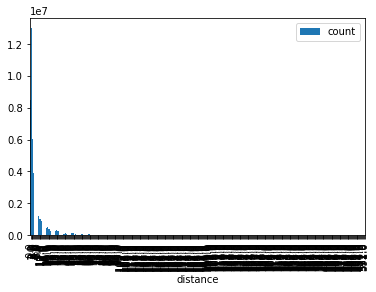

In [53]:
euc_distances = rounded_euc_distance_DF.stack().value_counts()
euc_distances = pd.DataFrame({'distance':euc_distances.index, 'count':euc_distances.values})
euc_distances.sort_values('distance', inplace=True)
euc_distances.plot.bar(x="distance", y="count")

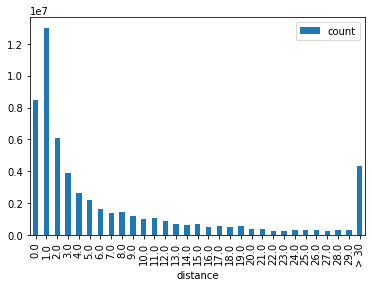

In [54]:
group = euc_distances[:30]
group_euc_distances = group.append({'distance' : '> 30' , 'count' : euc_distances[30:]['count'].sum()}, ignore_index=True)
group_euc_distances.plot.bar(x="distance", y="count")

#### Hamming Further Working

In [0]:
hamming_distances = hamming_distance_DF.stack().value_counts()
hamming_distances = pd.DataFrame({'distance':hamming_distances.index, 'count':hamming_distances.values})
hamming_distances = hamming_distances.round(1)
hamming_distances.sort_values('distance', inplace=True)

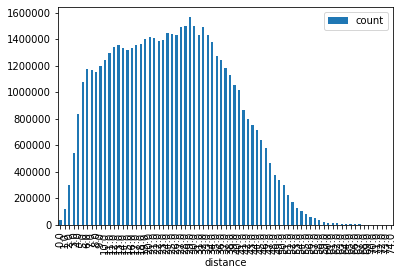

In [57]:
hamming_distances.plot.bar(x="distance", y="count")

## Plot Euclidean Distance

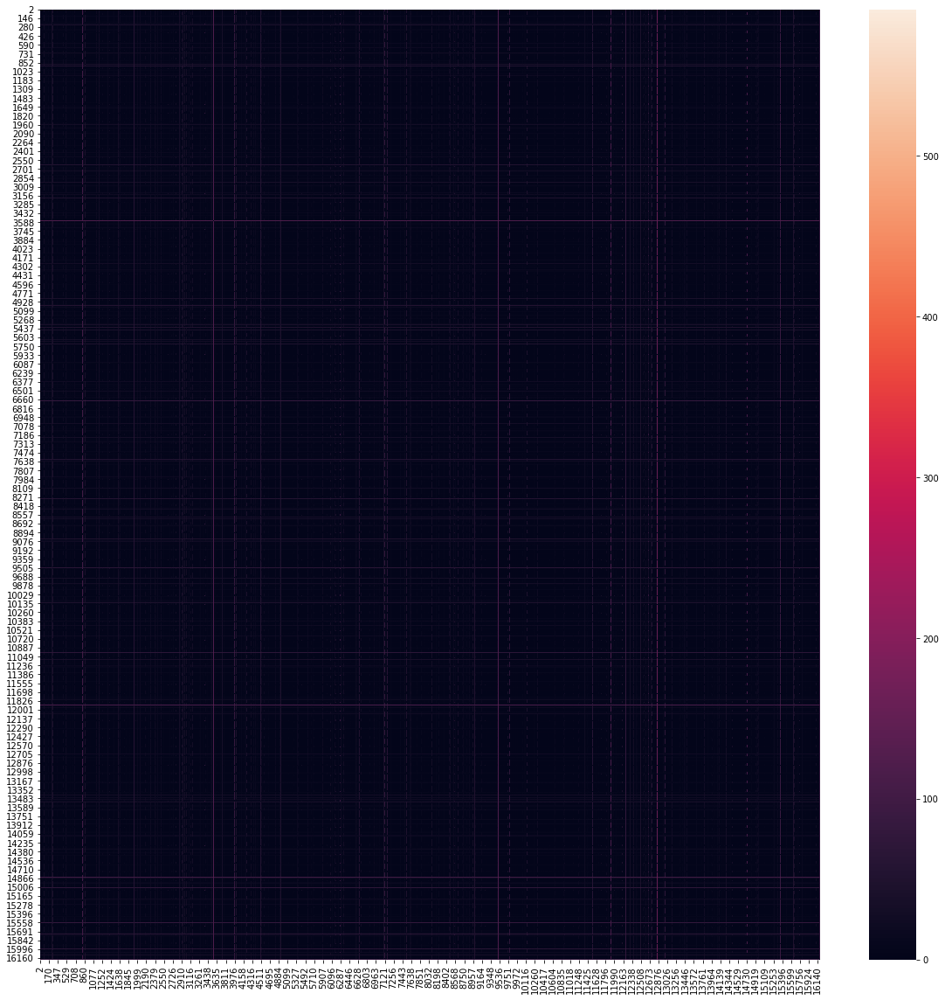

In [65]:
plt.subplots(figsize=(20,20))
sns.heatmap(euc_distance_DF)

## Plot Hamming Distance

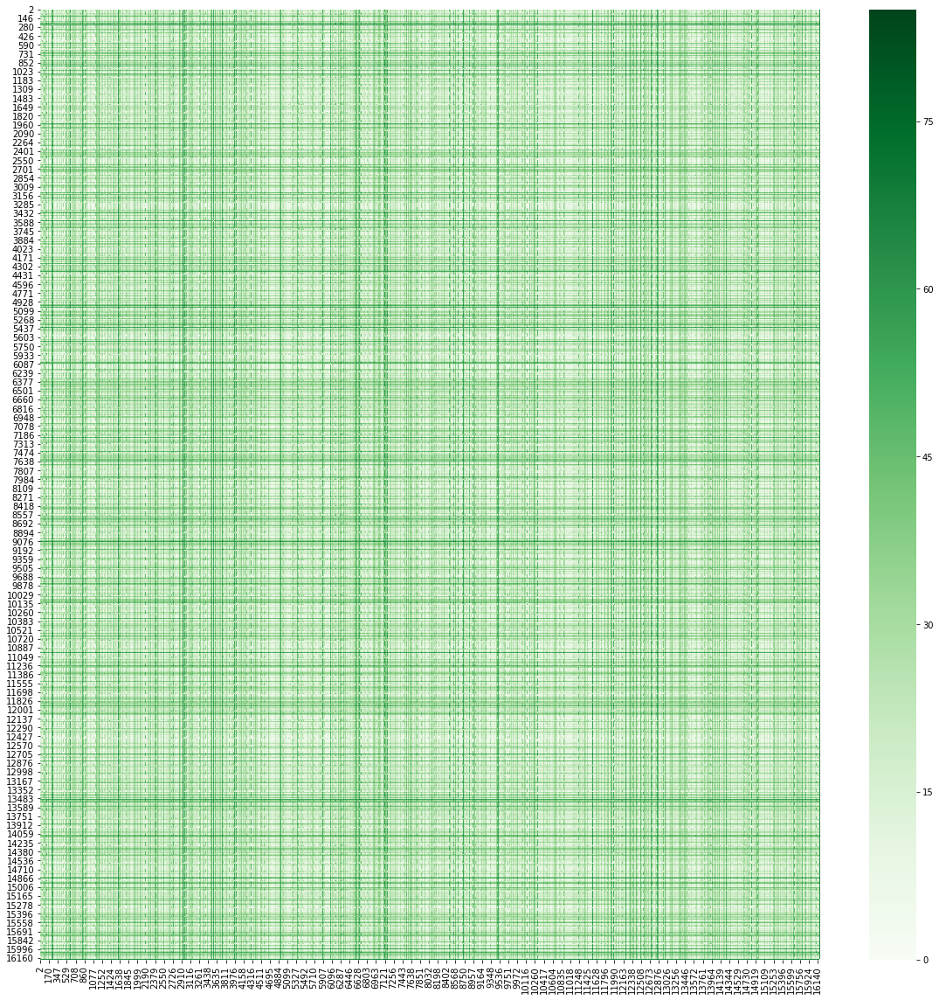

In [0]:
# a lot of data, next step is to filter out useless users from other data sets
plt.subplots(figsize=(20,20))
sns.heatmap(hamming_distance_DF, cmap="Greens")

## Other Working

In [0]:
filter_df = data['duration_seen_seconds']>86400
filter_df.value_counts()

True     5768
False    4600
Name: duration_seen_seconds, dtype: int64

In [0]:
counts = data["genreID"].value_counts(dropna=True, sort=True)
genre_count_DF = pd.DataFrame(counts).reset_index()
genre_count_DF.columns = ["genreID", "counts"]
genre_count_DF

,genreID,counts
0,nan,12732
1,6014.0,6351
2,6002.0,3095
3,6016.0,2671
4,6012.0,2142
5,6008.0,1996
6,6007.0,1741
7,6017.0,1502
8,6009.0,1403
9,6003.0,1377


In [0]:
temp = pd.DataFrame(newData["userID"].value_counts())
#temp.columns = ["userID", "count"]

In [0]:
temp

,userID
4942,908
6614,532
10977,470
2744,444
6308,424
...,...
13468,1
2867,1
11738,1
13364,1


In [0]:
count_temp = pd.DataFrame(temp["userID"].value_counts())

In [0]:
count_temp

,userID
3,1007
1,745
4,717
2,600
5,574
...,...
284,1
292,1
186,1
532,1


In [0]:
for index, row in distance_DF.iterrows():
    counts = distance_DF[index].value_counts()

print(counts)

37.0    15
36.0    15
33.0    10
35.0     9
34.0     7
32.0     7
29.0     6
31.0     5
24.0     4
30.0     4
28.0     3
27.0     3
23.0     2
25.0     2
26.0     2
39.0     1
38.0     1
21.0     1
22.0     1
20.0     1
0.0      1
Name: 142, dtype: int64


In [0]:
temp_user_apps_DF = user_apps_DF.drop(user_apps_DF.index[100:])

In [0]:
temp_user_apps_DF

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,...,45749,45750,45751,45752,45753,45754,45755,45756,45757,45758,45759,45760,45761,45762,45763,45764,45765,45766,45767,45768,45769,45770,45771,45772,45773,45774,45775,45776,45777,45778,45779,45780,45781,45782,45783,45784,45785,45786,45787,45788
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
139,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
140,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
141,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Create data with the top 100, 300 and 500 apps only
top_100 = temp_user_apps_DF.drop(app_counts_DF['appID'].iloc[100:], axis=1)

## make a function to create top apps and users
user_top_1_apps_DF = user_apps_DF.drop(app_counts_DF['appID'].iloc[1:], axis=1)
user_top_5_apps_DF = user_apps_DF.drop(app_counts_DF['appID'].iloc[5:], axis=1)
user_top_10_apps_DF = user_apps_DF.drop(app_counts_DF['appID'].iloc[10:], axis=1)
user_top_50_apps_DF = user_apps_DF.drop(app_counts_DF['appID'].iloc[50:], axis=1)
user_top_100_apps_DF = user_apps_DF.drop(app_counts_DF['appID'].iloc[100:], axis=1)
user_top_300_apps_DF = user_apps_DF.drop(app_counts_DF['appID'].iloc[300:], axis=1)
user_top_500_apps_DF = user_apps_DF.drop(app_counts_DF['appID'].iloc[500:], axis=1)

In [0]:
top_100

,312,3273,3909,3911,3912,3915,3920,3923,3929,3939,3941,3942,3945,3946,3947,3948,3949,3950,3952,3953,3954,3956,3958,3960,3968,3969,3972,3973,3976,3980,3981,3983,3989,3990,3991,4972,5344,6549,6638,7415,...,19208,19222,20278,21108,21971,23701,23980,25067,25234,25555,25935,26750,28804,28808,29274,29393,29964,30529,30753,31336,31430,32411,33480,33579,33855,34183,34715,34834,34843,35312,35377,36239,36306,36705,38666,40796,41213,42673,43313,45731
2,0,0,10,0,0,0,0,1,0,1,0,2,0,1,0,0,2,82,12,0,39,5,0,4,0,11,0,0,0,311,0,0,1,0,0,19,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,7,0,0,1,0,0,0,0,0,30,0,0,0,0,1,0,1,0,0,6,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0
5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,11,0,0,0,0,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138,0,0,0,0,1,0,0,0,0,0,0,0,0,5,0,0,0,3,1,6,45,0,0,0,0,3,0,0,0,189,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,6,34,0,0,0,0,0,0,0,0,0,0,0,0,0
139,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
140,0,0,80,20,66,5,0,0,0,5,0,17,15,428,0,0,9,254,102,63,253,6,26,0,0,221,1,0,1,3346,1,0,0,0,24,1,169,0,129,559,...,0,0,5,0,0,61,0,17,0,0,0,6,2,0,0,16,7,0,0,4,2,0,0,0,0,0,56,4,0,2,0,0,0,0,7,23,0,1302,0,0
141,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,18,0,0,0,0,0,0,3,0,0,3,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


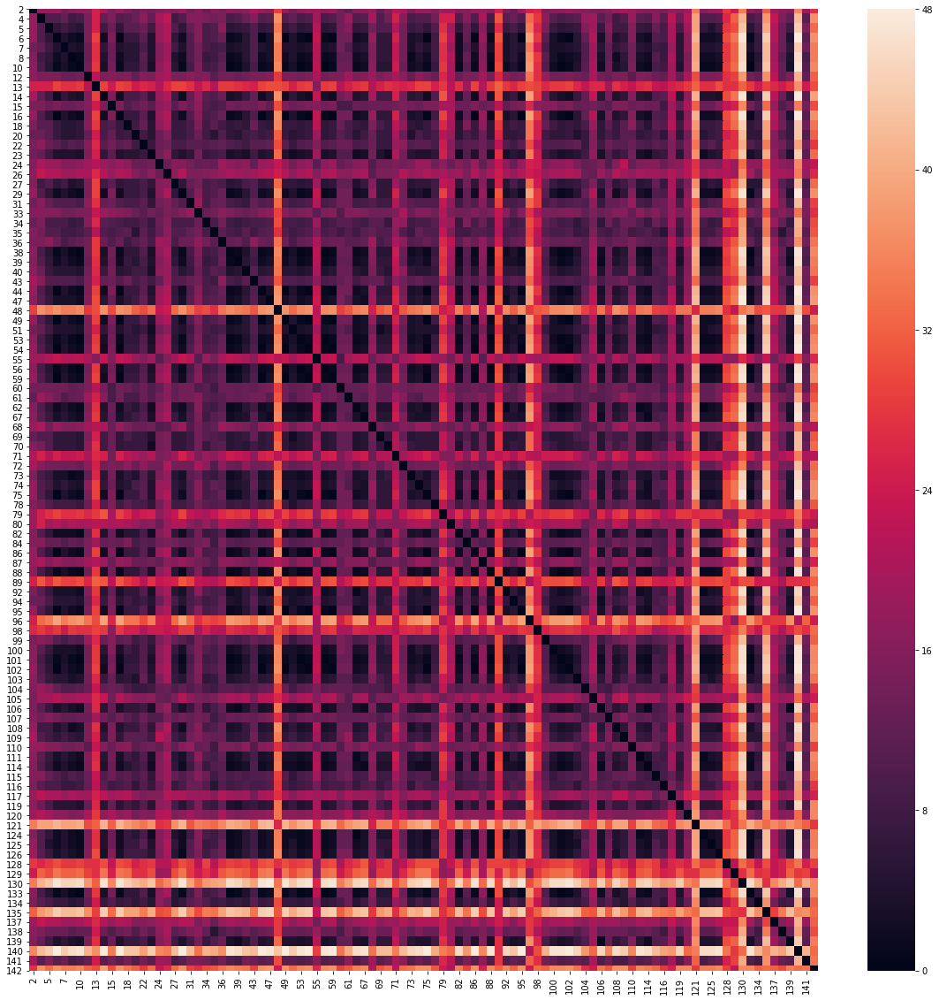

In [0]:
# a lot of data, next step is to filter out useless users from other data sets
plt.subplots(figsize=(20,20))
sns.heatmap(distance_DF)

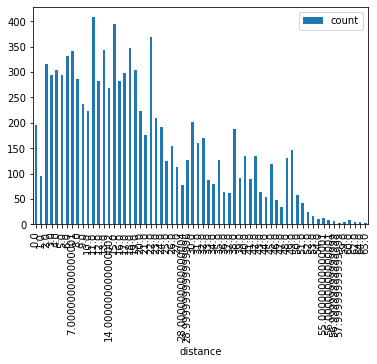

In [0]:
distances.plot.bar(x="distance", y="count")